In [1]:
include("source.jl")
include("NS_FVM_solver.jl")
using JLD
training_data_path = "data/KF/training_data.jld"

using Plots

# Navier stokes equations

In this notebook we consider the incompressible forced Navier-Stokes equations

$$ \frac{\partial \mathbf{V}}{\partial t} = - (\mathbf{V} \cdot \nabla)\mathbf{V} + \frac{1}{\text{Re}}\nabla^2\mathbf{V} -\nabla p + \mathbf{F} \\
\nabla \cdot \mathbf{V} = 0
$$

for $\mathbf{V} = \begin{bmatrix} u & v \end{bmatrix}^T$. We consider Kolmogorov Flow in 2D with periodic boundary condtions. In this case the forcing is defined as

$$ \mathbf{F} = \begin{bmatrix}{\sin(4y)} \\ 0 \end{bmatrix} - 0.1 \mathbf{V}.$$

Training data is obtained by running the generate_KF_data.jl script.

## Load training data

In [2]:
t_data, sim_data, F = (load(training_data_path)[i] for i in ("t","V","F"))
0

0

## Initialize meshes and define compression factor

In [3]:
N = size(sim_data)[1:2]
UPC = size(sim_data)[3]        


x= collect(LinRange(-pi,pi,N[1]+1))
y = collect(LinRange(-pi,pi,N[2]+1))

fine_mesh = gen_mesh(x,y,UPC = UPC)

# number of unknowns per cell

J = (8,8) # compression in each direction
coarse_mesh = gen_coarse_from_fine_mesh(fine_mesh,J)
MP = gen_mesh_pair(fine_mesh,coarse_mesh)
0



┌ Warning: Layer with Float32 parameters got Float64 input.
│   The input will be converted, but any earlier layers may be very slow.
│   layer = ConvTranspose((8, 8), 2 => 2, stride=8, bias=false)  # 256 parameters
│   summary(x) = "32×32×2×1 Array{Float64, 4}"
└ @ Flux ~/.julia/packages/Flux/jgpVj/src/layers/stateless.jl:60


0

## Generate the operators used to solve Navier-Stokes

In [4]:
setup = gen_setup(fine_mesh)
0

0

## Compute vorticity of the DNS and display

The voriticity $\omega$ is computed as 


$$\omega = \frac{\partial v}{\partial x} - \frac{\partial u}{\partial y} $$.

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/DNS_flow.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/DNS_flow.gif")
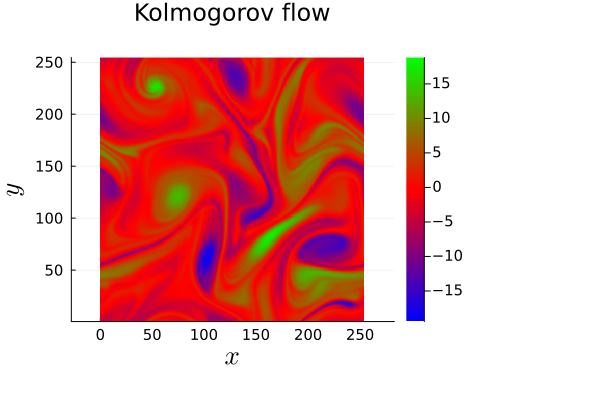

In [5]:
to_plot = setup.O.w(sim_data[:,:,:,1,1:50])[:,:,1,:]

ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "Kolmogorov flow",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "DNS_flow.gif", fps = 30)

## Energy trajectory of the DNS

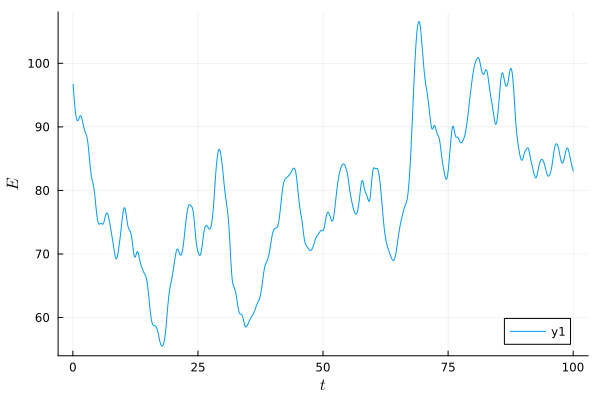

In [6]:
energies = fine_mesh.ip(sim_data,sim_data)
plot(t_data[:,:,:,1,:][1:end],energies[:,:,:,1,:][1:end])
xlabel!(L"t")
ylabel!(L"E")

# Filtering and Local POD

## Discrete solution

Let us consider a continuous solution $\mathbf{V}(\mathbf{x},t)  \in \mathbb{R}^2$:
\begin{equation}
    \mathbf{V} = \begin{bmatrix}
        u \\ v
    \end{bmatrix}
\end{equation}
to the 2D incompressible Navier-Stokes equations on the domain $\Omega$. This solution is obtained by interpolating a DNS solution using some finite-dimensional basis.

Next, we divide the domain into coarse-grid cells. These are chosen to be much larger than the grid cells used for the DNS. On each of the coarse grid-cells we define a set of orthonormal basis functions $\boldsymbol{\phi}_{ij}(\mathbf{x}) \in \mathbb{R}^2$, where $i=1,\ldots,I$ indicates the considered grid cell and $j = 1,\ldots,J$ the considered basis function. These function are only non-zero on their associated coarse grid-cell $\Omega_i$. Note that this basis must be constructed in a consistent fashion between grid cells. In addition, this basis must be sufficiently large such we can express $\mathbf{V}$ in terms of this basis
\begin{equation}
    \mathbf{V}(t,\mathbf{x}) = \sum^{IJ}_{i=1,j=1} b_{ij}(t)\boldsymbol{\phi}_{ij}(\mathbf{x}). 
\end{equation}
The coefficients $b_{ij}$ are obtained as
\begin{equation}
    b_{ij}(t) = \frac{1}{|\Omega_i|}\int_{\Omega_i} \mathbf{V}(t,\mathbf{x})\cdot \boldsymbol{\phi}_{ij}(\mathbf{x})\text{d}\Omega.
\end{equation}
The first basis functions are chosen to be
\begin{equation}
     \boldsymbol{\phi}_{i1}(\mathbf{x}) = \begin{bmatrix} 1 \\ 0 \end{bmatrix}, \quad \boldsymbol{\phi}_{i2}(\mathbf{x}) = \begin{bmatrix} 0 \\ 1 \end{bmatrix}
\end{equation}
such that $b_{i1}$ and $b_{i2}$ can be interpreted as a discrete filtered solution
\begin{equation}
    \bar{\text{u}}_i := b_{i1} = \frac{1}{|\Omega_i|} \int_{\Omega_i} u \text{d}\Omega, \quad \bar{\text{v}}_i:= b_{i2} =  \frac{1}{|\Omega_i|} \int_{\Omega_i} v \text{d}\Omega.
\end{equation}
In turn, we can make the distinction between resolved scales $\bar{\mathbf{V}}$ and SGS content $\mathbf{V}^\prime$:
\begin{equation}
    \mathbf{V}= \underbrace{\sum^{I}_{i=1} \bar{\text{u}}_i \boldsymbol{\phi}_{i1} + \bar{\text{v}}_i \boldsymbol{\phi}_{i2}}_{=:\bar{\mathbf{V}}} + \underbrace{\sum^{IJ}_{i=1, j=3} b_{ij}\boldsymbol{\phi}_{ij}}_{=:\mathbf{V}^\prime}.
\end{equation}
Due to the orthogonality of the local basis the total momentum is captured by the filtered solution
\begin{equation}
    \mathbf{P}:= \int_\Omega \mathbf{V} \text{d}\Omega = \sum^I_{i} |\Omega_i|\begin{bmatrix}
        \bar{\text{u}}_i \\ \bar{\text{v}}_i
    \end{bmatrix}.
\end{equation}
However, the total energy does contain SGS contributions
\begin{equation}
    E := \frac{1}{2}\int_\Omega \mathbf{V}\cdot \mathbf{V} \text{d}\Omega = \underbrace{\frac{1}{2}\sum_{i=1}^I |\Omega_i| (\bar{\text{u}}_i^2 + \bar{\text{v}}_i^2)}_{=: \bar{E}} + \underbrace{\frac{1}{2}\sum^{IJ}_{i=1, j=3} |\Omega_i| b_{ij}^2}_{=: E^\prime}.
\end{equation}
Depending on the flow conditions we require a large basis to capture the SGS energy. Working in such a large basis requires a lot computational resources. 

## Local POD

In order to alleviate this we construct a new basis POD basis $\boldsymbol{\psi}_{ik}(\mathbf{x}) \in \mathbb{R}^2$:
 \begin{equation}
     \boldsymbol{\psi}_{ik}(\mathbf{x}) = \sum^{IJ}_{i=1,j=1} c_{jk} \boldsymbol{\phi}_{ij}(\mathbf{x}).
 \end{equation} 
 for $k = 1,\ldots,r$ and $2 < r < J$.
For the first two basis functions we simply take the resolved flow field, i.e. $\boldsymbol{\psi}_{i1} = \boldsymbol{\phi}_{i1}$ and $\boldsymbol{\psi}_{i2} = \boldsymbol{\phi}_{i2}$.
 The remaining coefficients $c_{jk}$ are obtained using a singular value decomposition (SVD) of the snapshot matrix the SGS coefficients at different points $t_1,t_2,\ldots t_p$ in time:
\begin{equation} \mathbf{X}_b = \begin{bmatrix} b_{13}(t_1) & b_{23}(t_1) & \ldots & b_{13}(t_2) & b_{23}(t_2) & \ldots & b_{13}(t_p) & b_{23}(t_p) \\
b_{14}(t_1) & b_{24}(t_1)& \ldots & b_{14}(t_2) & b_{24}(t_2)& \ldots &  b_{14}(t_p) & b_{24}(t_p)& \\
\vdots & \vdots & \ldots & \vdots & \vdots & \ldots & \vdots & \vdots  \\ 
b_{1J}(t_1) & b_{2J}(t_1)& \ldots & b_{1J}(t_2) & b_{2J}(t_2)& \ldots & b_{1J}(t_p) & b_{2J}(t_p)
\end{bmatrix} = \mathbf{U}\boldsymbol{\Sigma}\mathbf{H}^T.
\end{equation}
The coefficients values $c_{jk}$ for $j = 3,\ldots,r$ corresponds to the first $r-2$ columns of $\mathbf{U}$.

In this new basis the solution is approximated as 
\begin{equation}
    \mathbf{V}(t,\mathbf{x}) \approx \mathbf{V}_r(t,\mathbf{x}) := \sum^{Ir}_{i=1,k=1} a_{ik}(t)\boldsymbol{\psi}_{ij}(\mathbf{x}),
\end{equation}
where the POD coefficient values $a_{ik}$ are obtained as
\begin{equation}
\begin{split}
    a_{ik}(t) = \frac{1}{|\Omega_i|}\int_{\Omega_i} \mathbf{V}(t,\mathbf{x})\cdot \boldsymbol{\psi}_{ik}(\mathbf{x})\text{d}\Omega = \frac{1}{|\Omega_i|}\int_{\Omega_i} \sum^{J}_{j=1} b_{ij}(t)\boldsymbol{\phi}_{ij}(\mathbf{x})\cdot \sum^{J}_{j=1} c_{jk} \boldsymbol{\phi}_{ij}(\mathbf{x})\text{d}\Omega  = \sum^{J}_{j=1}b_{ij}(t)c_{jk},
\end{split}
\end{equation}
due to the orthonormality of the initial basis. This new basis representation minimizes the projection error
\begin{equation}
    \sum^p_{i=1} \int_\Omega ||\mathbf{V}(\mathbf{x},t_i) -\mathbf{V}_r(\mathbf{x},t_i)||_2^2\text{d}\Omega \quad \text{subject to} \quad \mathbf{P}(t) = \int_\Omega \mathbf{V}(\mathbf{x},t) \text{d}\Omega = \int_\Omega \mathbf{V}_r(\mathbf{x},t) \text{d}\Omega.
\end{equation}
The momentum constraint is satisfied as the first two basis functions capture all the momentum: $\boldsymbol{\psi}_{i1} = \boldsymbol{\phi}_{i1}$ and $\boldsymbol{\psi}_{i2} = \boldsymbol{\phi}_{i2}$. The total energy is approximated as
\begin{equation}
    E \approx E_r := \frac{1}{2}\int_\Omega \mathbf{V}_r \cdot \mathbf{V}_r \text{d}\Omega= \underbrace{\frac{1}{2}\sum_{i=1}^I |\Omega_i| (\bar{\text{u}}_i^2 + \bar{\text{v}}_i^2)}_{= \bar{E}} + \underbrace{\frac{1}{2}\sum^{IJ}_{i=1, j=3} |\Omega_i| a_{ij}^2}_{\approx E^\prime} = \mathbf{a}^T\boldsymbol{\Omega}\mathbf{a},
\end{equation}
where $\mathbf{a}\in \mathbb{R}^{Ir}$ is the vector containing the POD coefficients and $\boldsymbol{\Omega}$ the mass matrix.


## Carry out local POD

In [7]:
original_shape = size(sim_data)[end-1:end]

data = reshape(sim_data,(size(sim_data)[1:end-2]...,original_shape[2]*original_shape[1]))

conserve_momentum = true

true

In [8]:
rand(collect(1:10),5)

5-element Vector{Int64}:
 5
 3
 9
 5
 5

In [9]:

### momentum conserving correction of data set

number_of_snapshots = 100 ## use 500 for the SVS (otherwise I get memory issues)
random_indexes = rand(collect(1:size(data)[end]),(number_of_snapshots,))

data_hat = sqrt.(MP.omega_tilde) .* data[:,:,:,random_indexes]
reshape_for_local_SVD(data_hat,MP)

POD_modes,S = carry_out_local_SVD(data_hat,MP,subtract_average = conserve_momentum)

0
GC.gc()

In [10]:
save("POD_modes.jld","POD_modes",POD_modes,"S",S)


In [11]:
POD_modes, = (load("POD_modes.jld")[i] for i in ("POD_modes",))
#POD_modes,S = (load("POD_modes.jld")[i] for i in ("POD_modes","S"))

Base.Generator{Tuple{String}, var"#558#559"}(var"#558#559"(), ("POD_modes",))

## Singular values

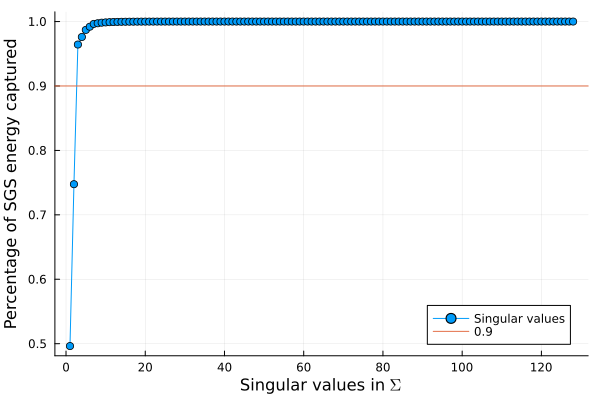

In [12]:
Plots.plot([sum(S[1:i].^2) for i in 1:size(S)[1]] ./ sum(S.^2),marker = true,label = "Singular values")
hline!([0.9],label = "0.9")
xlabel!("Singular values in " * L"\Sigma")
ylabel!("Percentage of SGS energy captured")

## Some of the POD modes

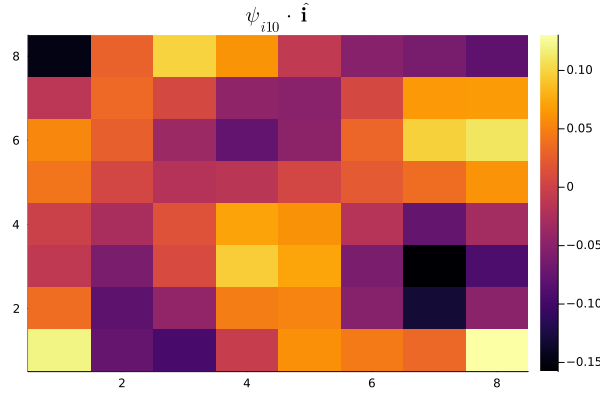

In [13]:
heatmap(POD_modes[:,:,1,20])
title!(L"\psi_{i10} \cdot \hat{\mathbf{i}}")

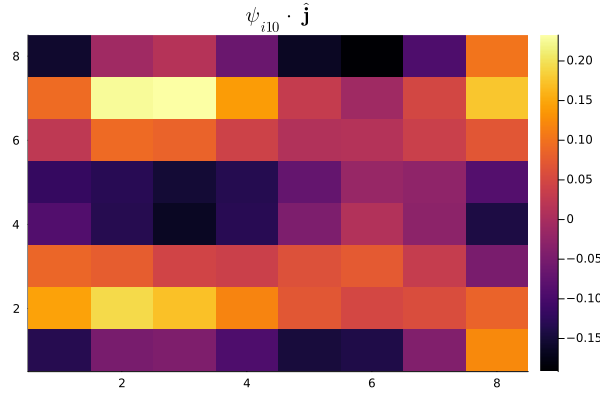

In [14]:
heatmap(POD_modes[:,:,2,20])
title!(L"\psi_{i10} \cdot \hat{\mathbf{j}}")

## Construct projection operators

In [15]:
r =50 #how many modes to include, including V_bar
uniform = true

if conserve_momentum 
    if r >= UPC + 1
        global_POD_modes = local_to_global_modes(POD_modes[[(:) for i in 1:fine_mesh.dims]...,:,1:(r-UPC)],MP)

    else
        global_POD_modes = 0
    end

    global_POD_modes = add_filter_to_modes(global_POD_modes,MP,orthogonalize = !uniform)

else
    global_POD_modes = local_to_global_modes(POD_modes[[(:) for i in 1:fine_mesh.dims]...,:,1:r],MP)
end

PO = gen_projection_operators(global_POD_modes,MP,uniform =uniform)

GC.gc()


In [16]:
function true_W(u,setup,setup_bar,PO)
    
    UPC = setup.mesh.UPC
    dims = setup.mesh.dims

    
    a = PO.W(u)
    
    u_bar_c = a[[(:) for i in 1:dims]...,1:UPC,:]

    u_bar_s = u_bar_c
    
    r = setup_bar.O.M(padding(u_bar_s,Tuple((1 for i in 1:dims)),circular = true))
    p = setup_bar.PS(r)
    
    Gp = setup_bar.O.G(padding(p,Tuple((1 for i in 1:dims)),circular = true))
    
    u_bar_s -= Gp
    
    return cat(u_bar_s,a[[(:) for i in 1:dims]...,UPC+1:end,:],dims = dims+1)
end



function true_R(a,setup,setup_bar,PO)
    
    UPC = setup.mesh.UPC
    dims = setup.mesh.dims
    
    
    

    
    u_r = PO.R(a)
    
    r = setup.O.M(padding(u_r,Tuple((1 for i in 1:dims)),circular = true))
    p = setup.PS(r)

    Gp = setup.O.G(padding(p,Tuple((1 for i in 1:dims)),circular = true))
    
    u_r -= Gp
    
    
    return u_r
end





true_R (generic function with 1 method)

## Project reference data onto POD space

In [26]:
GC.gc()

setup_bar = gen_setup(coarse_mesh)

W(u,setup = setup,setup_bar = setup_bar,PO = PO) = true_W(u,setup,setup_bar,PO)
R(a,setup = setup,setup_bar = setup_bar,PO = PO) = true_R(a,setup,setup_bar,PO)

ref_data = W(data)
data = 0

F_a = W(F)
rhs_bar = gen_rhs(setup_bar,F_a[:,:,1:2,:];Re = 1000,damping = 0.1)
0

0

In [18]:
heatmap(ref_Gp[:,:,1,1])

LoadError: UndefVarError: `ref_Gp` not defined

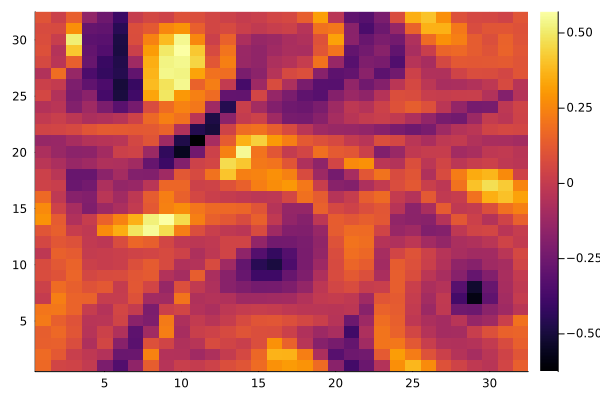

In [19]:
heatmap(ref_data[:,:,3,1])

## Plot vorticity of reconstructed $\mathbf{u}_r$

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/DNS_flow.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/DNS_flow.gif")
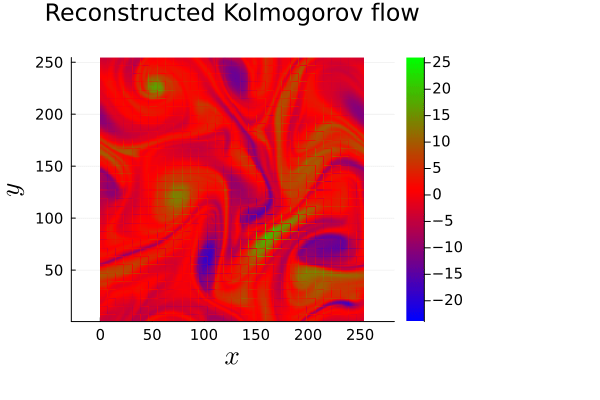

In [20]:
to_plot = setup.O.w(R(ref_data[:,:,:,1:50]))[:,:,1,:]

ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "Reconstructed Kolmogorov flow",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end
to_plot = 0
gif(anim, "DNS_flow.gif", fps = 30)


# Evolution of the state

We are interested in marching the coefficients $\mathbf{a}$ forward in time:

$$ \frac{\text{d}\mathbf{a}}{\text{d}t} = ????? $$.

One option would be to do a Galerkin projection, however this scales cubically due to the presence of the non-linear term in the Navier-Stokes equations. Also it would be difficult to deal with the algebraic constraint. It is therefore we propose to use our structure-preserving closure modeling framework introduced in https://arxiv.org/abs/2301.13770. This works as follows:

We first obtain $\mathbf{a}\in \mathbb{R}^{rI}$ from a discrete DNS $\mathbf{V}_h \in \mathbb{R}^{2N}$:

$$ \mathbf{a} = \begin{bmatrix} \bar{\mathbf{V}}_h \\ \text{SGS modes}  \end{bmatrix}=  \mathbf{P} \mathbf{A}_{c}^s \mathbf{T}\mathbf{V}_h$$,

where $\mathbf{T}$ is the discretized local POD projection. The first two modes of each coarse grid cell will be referred as $\bar{\mathbf{V}}_h \in \mathbb{R}^{2I}$ which correspond to the averaged velocity in each direction. We use a staggered grid finite volume implementation for our coarse grid model. We therefore project $\bar{\mathbf{V}}$ onto this staggered grid using the operator $\mathbf{A}_{c}^s \in \mathbb{R}^{rI \times rI}$. In addition we project onto a divergence free basis using the operator $\mathbf{P} \in \mathbb{R}^{rI \times rI}$. Note that these final two operator do not affect the SGS modes of $\mathbf{a}$ but only $\bar{\mathbf{V}}$. The evolution equation is modeled as follows:

$$\frac{\text{d}\mathbf{a}}{\text{d}t} \approx \begin{bmatrix} -\mathbf{C}(\bar{\mathbf{V}}_h)\bar{\mathbf{V}}_h+\frac{1}{\text{Re}}\mathbf{D}\bar{\mathbf{V}}_h - \mathbf{G}\bar{\mathbf{p}}_h\\ \mathbf{0} \end{bmatrix} +\mathbf{A}_{c}^s \text{SP}(\mathbf{A}_{s}^c \mathbf{a}) + \mathbf{P} \mathbf{A}_{c}^s \mathbf{T} \mathbf{F}, \\ 
\mathbf{M}\bar{\mathbf{V}}_h= 0,$$

where $\mathbf{A}_{s}^c$ projects $\bar{\mathbf{V}}_h$ onto a cell-centred grid such that it plays nicely with the convolutional neural network contained in our structure-preserving closure $\text{SP}$. For $\bar{\mathbf{V}}_h$ we also include the coarse discretization. In the absence of forcing this model is strictly dissipative:

$$ \frac{1}{2} \frac{\text{d}\mathbf{a}^T\boldsymbol{\Omega}\mathbf{a}}{\text{d}t} = \mathbf{a}^T\boldsymbol{\Omega}\frac{\text{d}\mathbf{a}}{\text{d}t} = \leq  0.$$

## Define neural network and full framework including phyiscs

In [21]:
kernel_sizes= [(1,1),(1,1)]
channels = [r+2,50] # r+2 as the first channels are the coarse rhs
strides = [(1,1),(1,1)]
B = (1,1)
boundary_padding = "c" #[["c","c"];;[0,0]]


constrain_energy =true # whether to use a physics constrained NN or not
dissipation = true # include dissipation if physics is constrained
conserve_momentum =true # conserve momentum if physics is constrained


model = gen_skew_NN(kernel_sizes,channels,strides,r,B,boundary_padding = boundary_padding,UPC = coarse_mesh.UPC,constrain_energy = constrain_energy,dissipation = dissipation,conserve_momentum = conserve_momentum)
0

0

In [22]:
function neural_rhs(a,mesh,t;rhs = rhs_bar,setup = setup_bar,model = model,F = F_a,B=B,damping = 0.1;other_arguments = 0)
    
    dims = mesh.dims
    
    u_s = a[:,:,1:2,:]
    
    RHS = rhs(u_s,mesh,t,solve_pressure = false)
    

    
    input = cat(RHS,a,dims = dims +1)  

    nn_output = model.eval(input,a = padding(a,2 .* B,circular = true))
    
    
    ### find pressure based on NN_output

    r = setup.O.M(padding(RHS + nn_output[:,:,1:2,:] ,(1,1),circular = true))
    
    p = setup.PS(r)
    
    Gp = setup.O.G(padding(p,(1,1),circular = true))
     
    ####################################
    # include damping from kolmogorov flow
    physics_rhs = cat(RHS - Gp , - damping * a[:,:,3:end,:] .+ F[:,:,3:end,:] ,dims = dims +1) 

    return nn_output +   physics_rhs
    
    
end

neural_rhs (generic function with 7 methods)

In [ ]:
function galerkin_rhs(a,mesh,t,rhs = rhs,W = true_W,R = true_R,setup = setup;other_arguments = 0)
    return RHS = W(rhs(R(a),mesh,t,solve_pressure = false))
end

## Preprate trajectory fitting

In [44]:
# remove data that lies at the end of the simulation
traj_dt = 0.025
traj_steps = 5

buffer_dt = traj_steps * traj_dt 



simulation_indexes = collect(1:original_shape[end-1])'
simulation_indexes = cat([simulation_indexes for i in 1:original_shape[end]]...,dims = fine_mesh.dims + 2)
simulation_indexes = simulation_indexes[1:end]
simulation_times = t_data[1:end]

ref_data_trajectory = reshape(ref_data,(size(ref_data)[1:coarse_mesh.dims+1]...,original_shape...))
        
#### such that we can interpolate between our snapshots
sim_interpolator = gen_time_interpolator(t_data,ref_data_trajectory)

select = buffer_dt .< maximum(simulation_times) .- simulation_times

traj_data = ref_data[[(:) for i in 1:coarse_mesh.dims+1]...,select]
traj_indexes = simulation_indexes[select]
traj_times = simulation_times[select]


function trajectory_fitting_loss(input,indexes,times,dt = traj_dt,steps = traj_steps,sim_interpolator = sim_interpolator,neural_rhs = neural_rhs,coarse_mesh = coarse_mesh)
    dims = length(size(input)) - 2
    
    t_start = reshape(times,([1 for i in 1:dims+1]...,size(times)[1]))
    t_end =  t_start .+ steps *dt
    t,result = simulate(input,coarse_mesh,dt,t_start,t_end,neural_rhs,time_step,save_every = 1,pre_allocate = false) 
    reference = stop_gradient() do
        sim_interpolator(t,simulation_indexes = indexes)
    end
    return Flux.Losses.mse(result,reference)
end    
    


trajectory_fitting_loss (generic function with 6 methods)

## Evaluate loss for some the snapshots

In [45]:
snapshots_included = 50
select = rand(collect(1:prod(size(traj_indexes))),(snapshots_included))
sqrt.(trajectory_fitting_loss(traj_data[:,:,:,select],traj_indexes[select],traj_times[select]))


0.0066356389317900905

# Train model using trajectory fitting

In [46]:
opt = ADAM()

Adam(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [97]:
ps = Flux.params(model.CNN,model.B_mats...)
epochs =200
losses = zeros(epochs)

batchsize = 10

for epoch in tqdm(1:epochs)
    
    ###### Load a subset of the data ######
    select = rand(collect(1:prod(size(traj_indexes))),(snapshots_included))
    trajectory_fitting_data_loader = Flux.Data.DataLoader((traj_data[:,:,:,select],traj_indexes[select],traj_times[select]), batchsize=batchsize,shuffle=true)
    #######################################
    
    Flux.train!(trajectory_fitting_loss,ps, trajectory_fitting_data_loader, opt)
    train_loss = trajectory_fitting_loss(traj_data[:,:,:,select],traj_indexes[select],traj_times[select])
    losses[epoch] = train_loss
    GC.gc()
end

0.0%┣                                              ┫ 0/200 [00:00<00:00, -0s/it]
0.5%┣▏                                         ┫ 1/200 [00:10<Inf:Inf, InfGs/it]
1.0%┣▍                                          ┫ 2/200 [00:20<01:05:48, 20s/it]
1.5%┣▊                                             ┫ 3/200 [00:30<49:33, 15s/it]
2.0%┣█                                             ┫ 4/200 [00:41<44:17, 14s/it]
2.5%┣█▏                                            ┫ 5/200 [00:52<41:51, 13s/it]
3.0%┣█▍                                            ┫ 6/200 [01:05<42:11, 13s/it]
3.5%┣█▋                                            ┫ 7/200 [01:19<42:15, 13s/it]
4.0%┣█▉                                            ┫ 8/200 [01:33<42:19, 13s/it]
4.5%┣██                                            ┫ 9/200 [01:45<41:35, 13s/it]
5.0%┣██▎                                          ┫ 10/200 [01:56<40:51, 13s/it]
5.5%┣██▌                                          ┫ 11/200 [02:09<40:34, 13s/it]
6.0%┣██▊                    

51.0%┣██████████████████████                     ┫ 102/200 [22:36<21:56, 13s/it]
51.5%┣██████████████████████▏                    ┫ 103/200 [22:50<21:43, 13s/it]
52.0%┣██████████████████████▍                    ┫ 104/200 [23:03<21:29, 13s/it]
52.5%┣██████████████████████▋                    ┫ 105/200 [23:17<21:16, 13s/it]
53.0%┣██████████████████████▉                    ┫ 106/200 [23:31<21:03, 13s/it]
53.5%┣███████████████████████                    ┫ 107/200 [23:44<20:50, 13s/it]
54.0%┣███████████████████████▏                   ┫ 108/200 [23:58<20:36, 13s/it]
54.5%┣███████████████████████▍                   ┫ 109/200 [24:11<20:23, 13s/it]
55.0%┣███████████████████████▋                   ┫ 110/200 [24:25<20:09, 13s/it]
55.5%┣███████████████████████▉                   ┫ 111/200 [24:38<19:56, 13s/it]
56.0%┣████████████████████████                   ┫ 112/200 [24:52<19:42, 13s/it]
56.5%┣████████████████████████▎                  ┫ 113/200 [25:05<19:29, 13s/it]
57.0%┣██████████████████████

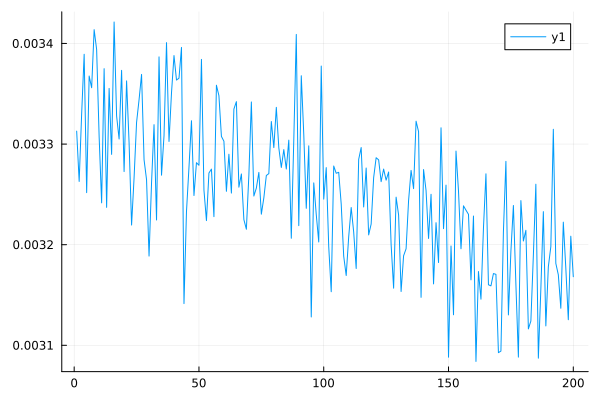

In [98]:
plot(sqrt.(losses))

In [99]:
include("source.jl")

load_skew_model (generic function with 1 method)

In [100]:
POD_modes

32×32×2×2048 Array{Float64, 4}:
[:, :, 1, 1] =
 -0.0314207  -0.0306052  -0.0295687  …  0.0312906  0.0324336  0.0333891
 -0.0323186  -0.0314754  -0.0304107     0.0321377  0.0333078  0.0342826
 -0.0331865  -0.0323183  -0.0312295     0.032953   0.0341513  0.0351458
 -0.0340186  -0.0331311  -0.0320212     0.0337318  0.0349572  0.0359713
 -0.0348112  -0.0339086  -0.0327787     0.0344673  0.0357196  0.0367546
 -0.0355588  -0.0346446  -0.0334971  …  0.0351562  0.0364341  0.037491
 -0.0362576  -0.0353363  -0.0341758     0.0357991  0.037099   0.0381727
 -0.0369072  -0.0359819  -0.0348124     0.0363919  0.0377136  0.0387989
 -0.0375047  -0.0365782  -0.035404      0.0369269  0.0382711  0.0393706
 -0.0380459  -0.0371208  -0.0359448     0.0374009  0.0387651  0.0398821
 -0.0385288  -0.0376054  -0.0364261  …  0.0378111  0.0391928  0.0403264
 -0.0389488  -0.0380254  -0.0368413     0.0381537  0.039552   0.040701
 -0.0393007  -0.0383744  -0.0371863     0.0384269  0.0398429  0.041006
  ⋮                 

# Save model

In [101]:
save_skew_model(model,"first_model")


Model saved at directory [first_model]


In [102]:
model = load_skew_model("first_model")


Model loaded from directory [first_model]


skew_model_struct(var"#NN#1034"{String, Bool, Bool, Bool, Int64, Tuple{Int64, Int64}, var"#NN#1028#1035", Vector{Array{Float32, 4}}, Chain{Tuple{Conv{2, 2, typeof(relu), Array{Float32, 4}, Vector{Float32}}, Conv{2, 2, typeof(identity), Array{Float32, 4}, Vector{Float32}}}}}(Core.Box(2), "c", true, true, true, 50, (1, 1), var"#NN#1028#1035"(Core.Box([0.00045283663 0.02701017 0.009902233; 0.025950827 -0.075633846 0.008243575; -0.004096719 0.029874777 -0.0033529026;;; -0.020071182 0.043952737 0.009095812; -0.015439797 0.007389878 0.03306229; -0.033265114 0.052086946 -0.044267397;;; 0.045587488 0.077170864 -0.053557467; -0.053755134 -0.034350153 -0.06879854; 0.07519695 0.06710005 0.05267609;;; … ;;; 0.041731216 -0.0459715 0.059395444; 0.027239664 -0.034477204 -0.04244469; -0.019736897 -0.07171955 -0.023603354;;; 0.04273867 0.024696153 -0.032232217; 0.026922978 0.03440279 -0.05965112; -0.010002974 -0.05695964 -0.05166159;;; -0.021336708 0.058621045 0.046994686; -0.020236066 0.070340134 0.01

## Run simulation to test

In [103]:
t_start = 0
t_end = 100
dt = 0.025
save_every = 2
pre_allocate = true
init_cond = ref_data[:,:,:,1:1]

t,pred_sim = simulate(init_cond,coarse_mesh,dt,t_start,t_end,neural_rhs,time_step,save_every = save_every,pre_allocate = pre_allocate) 
t_pred = t[1:end]
pred_sim = pred_sim[:,:,:,1,:]



0.0%┣                                             ┫ 0/4.0k [00:00<00:00, -0s/it]
0.0%┣                                         ┫ 1/4.0k [00:03<Inf:Inf, InfGs/it]
0.1%┣                                           ┫ 2/4.0k [00:03<03:24:22, 3s/it]
0.1%┣                                              ┫ 6/4.0k [00:03<41:31, 2it/s]
0.2%┣▏                                            ┫ 10/4.0k [00:03<23:27, 3it/s]
0.4%┣▏                                            ┫ 15/4.0k [00:03<15:20, 4it/s]
0.5%┣▏                                            ┫ 19/4.0k [00:03<12:06, 5it/s]
0.6%┣▎                                            ┫ 24/4.0k [00:03<09:38, 7it/s]
0.7%┣▎                                            ┫ 28/4.0k [00:03<08:20, 8it/s]
0.8%┣▍                                            ┫ 33/4.0k [00:03<07:09, 9it/s]
0.9%┣▍                                           ┫ 38/4.0k [00:04<06:22, 10it/s]
1.1%┣▌                                           ┫ 42/4.0k [00:04<05:50, 11it/s]
1.2%┣▌                      

11.7%┣█████                                     ┫ 468/4.0k [00:09<01:08, 52it/s]
11.8%┣█████                                     ┫ 473/4.0k [00:09<01:07, 53it/s]
11.9%┣█████                                     ┫ 478/4.0k [00:09<01:07, 53it/s]
12.1%┣█████                                     ┫ 483/4.0k [00:09<01:07, 53it/s]
12.2%┣█████▏                                    ┫ 488/4.0k [00:09<01:06, 53it/s]
12.3%┣█████▏                                    ┫ 493/4.0k [00:09<01:06, 53it/s]
12.4%┣█████▎                                    ┫ 498/4.0k [00:09<01:06, 53it/s]
12.6%┣█████▎                                    ┫ 503/4.0k [00:09<01:05, 54it/s]
12.7%┣█████▎                                    ┫ 507/4.0k [00:09<01:05, 54it/s]
12.8%┣█████▍                                    ┫ 512/4.0k [00:09<01:05, 54it/s]
12.9%┣█████▍                                    ┫ 517/4.0k [00:10<01:04, 54it/s]
13.1%┣█████▌                                    ┫ 522/4.0k [00:10<01:04, 54it/s]
13.2%┣█████▌                

23.7%┣██████████                                ┫ 947/4.0k [00:15<00:48, 64it/s]
23.8%┣██████████                                ┫ 952/4.0k [00:15<00:48, 64it/s]
23.9%┣██████████                                ┫ 957/4.0k [00:15<00:48, 64it/s]
24.1%┣██████████                                ┫ 962/4.0k [00:15<00:47, 64it/s]
24.2%┣██████████▏                               ┫ 967/4.0k [00:15<00:47, 64it/s]
24.3%┣██████████▏                               ┫ 972/4.0k [00:15<00:47, 64it/s]
24.4%┣██████████▎                               ┫ 977/4.0k [00:15<00:47, 64it/s]
24.5%┣██████████▎                               ┫ 980/4.0k [00:15<00:47, 64it/s]
24.6%┣██████████▍                               ┫ 985/4.0k [00:15<00:47, 64it/s]
24.8%┣██████████▍                               ┫ 990/4.0k [00:15<00:47, 64it/s]
24.9%┣██████████▌                               ┫ 995/4.0k [00:15<00:47, 64it/s]
25.0%┣██████████▎                              ┫ 1.0k/4.0k [00:15<00:46, 65it/s]
25.1%┣██████████▎           

36.0%┣██████████████▉                          ┫ 1.4k/4.0k [00:21<00:37, 69it/s]
36.2%┣██████████████▉                          ┫ 1.4k/4.0k [00:21<00:37, 69it/s]
36.3%┣██████████████▉                          ┫ 1.5k/4.0k [00:21<00:37, 69it/s]
36.4%┣███████████████                          ┫ 1.5k/4.0k [00:21<00:37, 69it/s]
36.5%┣███████████████                          ┫ 1.5k/4.0k [00:21<00:37, 69it/s]
36.6%┣███████████████                          ┫ 1.5k/4.0k [00:21<00:37, 69it/s]
36.8%┣███████████████                          ┫ 1.5k/4.0k [00:21<00:36, 69it/s]
36.9%┣███████████████▏                         ┫ 1.5k/4.0k [00:21<00:36, 69it/s]
37.0%┣███████████████▏                         ┫ 1.5k/4.0k [00:21<00:36, 69it/s]
37.1%┣███████████████▏                         ┫ 1.5k/4.0k [00:21<00:36, 69it/s]
37.2%┣███████████████▎                         ┫ 1.5k/4.0k [00:21<00:36, 69it/s]
37.4%┣███████████████▎                         ┫ 1.5k/4.0k [00:22<00:36, 69it/s]
37.5%┣███████████████▍      

48.4%┣███████████████████▉                     ┫ 1.9k/4.0k [00:27<00:29, 72it/s]
48.5%┣████████████████████                     ┫ 1.9k/4.0k [00:27<00:29, 72it/s]
48.7%┣████████████████████                     ┫ 1.9k/4.0k [00:27<00:29, 72it/s]
48.8%┣████████████████████                     ┫ 2.0k/4.0k [00:27<00:28, 72it/s]
48.9%┣████████████████████                     ┫ 2.0k/4.0k [00:27<00:28, 72it/s]
49.0%┣████████████████████                     ┫ 2.0k/4.0k [00:27<00:28, 72it/s]
49.2%┣████████████████████▏                    ┫ 2.0k/4.0k [00:27<00:28, 72it/s]
49.2%┣████████████████████▏                    ┫ 2.0k/4.0k [00:27<00:28, 72it/s]
49.4%┣████████████████████▎                    ┫ 2.0k/4.0k [00:27<00:28, 72it/s]
49.5%┣████████████████████▎                    ┫ 2.0k/4.0k [00:27<00:28, 72it/s]
49.6%┣████████████████████▍                    ┫ 2.0k/4.0k [00:27<00:28, 72it/s]
49.7%┣████████████████████▍                    ┫ 2.0k/4.0k [00:28<00:28, 72it/s]
49.9%┣████████████████████▍ 

60.8%┣█████████████████████████                ┫ 2.4k/4.0k [00:33<00:21, 74it/s]
60.9%┣█████████████████████████                ┫ 2.4k/4.0k [00:33<00:21, 74it/s]
61.1%┣█████████████████████████                ┫ 2.4k/4.0k [00:33<00:21, 74it/s]
61.2%┣█████████████████████████                ┫ 2.4k/4.0k [00:33<00:21, 74it/s]
61.3%┣█████████████████████████▏               ┫ 2.5k/4.0k [00:33<00:21, 74it/s]
61.4%┣█████████████████████████▏               ┫ 2.5k/4.0k [00:33<00:21, 74it/s]
61.6%┣█████████████████████████▎               ┫ 2.5k/4.0k [00:33<00:21, 74it/s]
61.7%┣█████████████████████████▎               ┫ 2.5k/4.0k [00:33<00:21, 74it/s]
61.8%┣█████████████████████████▎               ┫ 2.5k/4.0k [00:33<00:21, 74it/s]
61.9%┣█████████████████████████▍               ┫ 2.5k/4.0k [00:33<00:21, 74it/s]
62.0%┣█████████████████████████▍               ┫ 2.5k/4.0k [00:34<00:21, 74it/s]
62.2%┣█████████████████████████▌               ┫ 2.5k/4.0k [00:34<00:20, 74it/s]
62.3%┣██████████████████████

73.3%┣██████████████████████████████           ┫ 2.9k/4.0k [00:39<00:14, 75it/s]
73.5%┣██████████████████████████████▏          ┫ 2.9k/4.0k [00:39<00:14, 75it/s]
73.6%┣██████████████████████████████▏          ┫ 2.9k/4.0k [00:39<00:14, 75it/s]
73.7%┣██████████████████████████████▏          ┫ 2.9k/4.0k [00:39<00:14, 75it/s]
73.8%┣██████████████████████████████▎          ┫ 3.0k/4.0k [00:39<00:14, 75it/s]
73.9%┣██████████████████████████████▎          ┫ 3.0k/4.0k [00:39<00:14, 75it/s]
74.1%┣██████████████████████████████▍          ┫ 3.0k/4.0k [00:39<00:14, 75it/s]
74.2%┣██████████████████████████████▍          ┫ 3.0k/4.0k [00:40<00:14, 75it/s]
74.3%┣██████████████████████████████▌          ┫ 3.0k/4.0k [00:40<00:14, 75it/s]
74.4%┣██████████████████████████████▌          ┫ 3.0k/4.0k [00:40<00:14, 75it/s]
74.6%┣██████████████████████████████▋          ┫ 3.0k/4.0k [00:40<00:14, 75it/s]
74.7%┣██████████████████████████████▋          ┫ 3.0k/4.0k [00:40<00:13, 75it/s]
74.8%┣██████████████████████

85.9%┣███████████████████████████████████▏     ┫ 3.4k/4.0k [00:45<00:07, 76it/s]
86.0%┣███████████████████████████████████▎     ┫ 3.4k/4.0k [00:45<00:07, 76it/s]
86.1%┣███████████████████████████████████▎     ┫ 3.4k/4.0k [00:45<00:07, 76it/s]
86.2%┣███████████████████████████████████▍     ┫ 3.5k/4.0k [00:45<00:07, 76it/s]
86.4%┣███████████████████████████████████▍     ┫ 3.5k/4.0k [00:45<00:07, 76it/s]
86.5%┣███████████████████████████████████▌     ┫ 3.5k/4.0k [00:45<00:07, 76it/s]
86.6%┣███████████████████████████████████▌     ┫ 3.5k/4.0k [00:46<00:07, 76it/s]
86.7%┣███████████████████████████████████▋     ┫ 3.5k/4.0k [00:46<00:07, 76it/s]
86.9%┣███████████████████████████████████▋     ┫ 3.5k/4.0k [00:46<00:07, 76it/s]
87.0%┣███████████████████████████████████▋     ┫ 3.5k/4.0k [00:46<00:07, 76it/s]
87.1%┣███████████████████████████████████▊     ┫ 3.5k/4.0k [00:46<00:07, 76it/s]
87.2%┣███████████████████████████████████▊     ┫ 3.5k/4.0k [00:46<00:07, 76it/s]
87.4%┣██████████████████████

98.2%┣████████████████████████████████████████▎┫ 3.9k/4.0k [00:51<00:01, 77it/s]
98.3%┣████████████████████████████████████████▎┫ 3.9k/4.0k [00:51<00:01, 77it/s]
98.4%┣████████████████████████████████████████▍┫ 3.9k/4.0k [00:51<00:01, 77it/s]
98.5%┣████████████████████████████████████████▍┫ 3.9k/4.0k [00:51<00:01, 77it/s]
98.5%┣████████████████████████████████████████▍┫ 3.9k/4.0k [00:51<00:01, 77it/s]
98.6%┣████████████████████████████████████████▍┫ 3.9k/4.0k [00:51<00:01, 77it/s]
98.7%┣████████████████████████████████████████▌┫ 3.9k/4.0k [00:52<00:01, 77it/s]
98.8%┣████████████████████████████████████████▌┫ 4.0k/4.0k [00:52<00:01, 77it/s]
98.9%┣████████████████████████████████████████▌┫ 4.0k/4.0k [00:52<00:01, 77it/s]
99.0%┣████████████████████████████████████████▋┫ 4.0k/4.0k [00:52<00:01, 77it/s]
99.1%┣████████████████████████████████████████▋┫ 4.0k/4.0k [00:52<00:00, 77it/s]
99.2%┣████████████████████████████████████████▊┫ 4.0k/4.0k [00:52<00:00, 77it/s]
99.4%┣██████████████████████

8×8×50×2000 Array{Float64, 4}:
[:, :, 1, 1] =
  0.64059    -0.309744  -0.326291  …  -1.00455    -0.0445795  -0.456125
  0.0654251   0.285689   0.237786     -0.330564    0.188735   -1.23663
 -0.391025    0.395999   1.38899      -0.0436705   0.163485   -1.45103
 -0.177274   -0.313047   1.17931      -0.0184411  -0.632687   -0.889864
  0.38156    -1.03687   -0.690218     -0.156396   -0.572874    0.405482
  0.322944   -0.987881  -1.02657   …   0.283911   -0.0855519  -0.146375
  0.604637   -2.03443    0.624309     -0.337862   -0.62061    -0.195787
  0.637327   -1.64863    0.56593      -0.75531    -1.18945    -0.0350676

[:, :, 2, 1] =
  0.0328501   0.608015   0.0125827  …   0.159652   -0.514338  -0.747652
 -0.0160887   0.440361   0.330051       0.0311565  -0.255737  -0.230487
  0.719468    0.505718   1.21476        0.509687    0.484458   1.28063
 -0.613314   -1.17215   -0.448324       0.60389     0.741844   0.682032
 -1.32092    -1.2623    -1.31129       -0.945147   -1.38545   -1.87278
 -0.4

## Neural network prediction

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/NN_flow_1.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/NN_flow_1.gif")
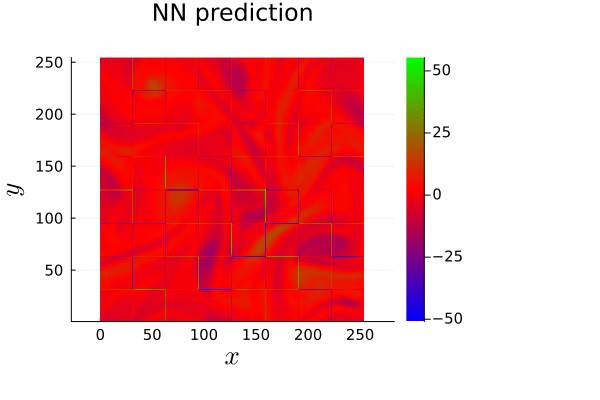

In [108]:
to_plot = setup.O.w(R(pred_sim[:,:,:,1:50]))[:,:,1,:]
#to_plot = setup_bar.O.w(pred_sim[:,:,1:2,:])[:,:,1,:]


ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "NN prediction",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "NN_flow_1.gif", fps = 30)

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/NN_flow_2.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/NN_flow_2.gif")
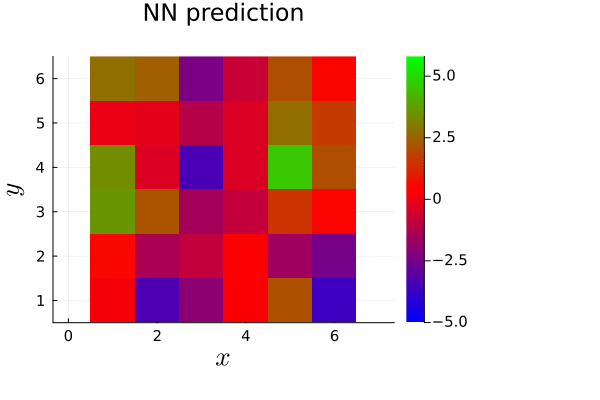

In [105]:
to_plot = setup_bar.O.w(pred_sim[:,:,1:2,1:50])[:,:,1,:]
#to_plot = setup_bar.O.w(pred_sim[:,:,1:2,:])[:,:,1,:]


ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "NN prediction",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "NN_flow_2.gif", fps = 30)

## Compare to ground truth

[ Info: Saved animation to /home/toby/Projects/Local_POD_NS/DNS_flow.gif


Plots.AnimatedGif("/home/toby/Projects/Local_POD_NS/DNS_flow.gif")
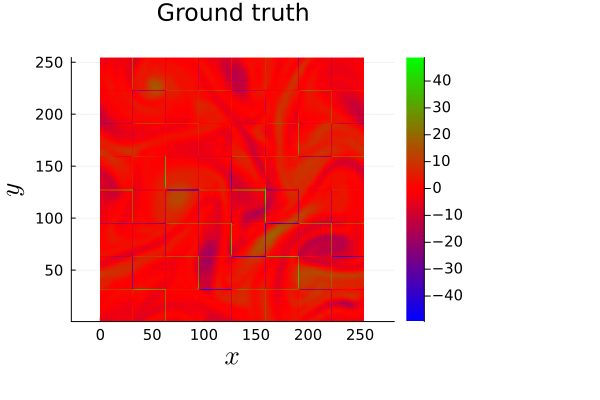

In [106]:
to_plot = setup.O.w(R(ref_data_trajectory[:,:,:,1,1:50]))[:,:,1,:]
#to_plot = setup_bar.O.w(pred_sim[:,:,1:2,:])[:,:,1,:]


ymin = minimum(to_plot)
ymax = maximum(to_plot)


anim = @animate for index in 1:size(to_plot)[3]
    Plots.heatmap(to_plot[:,:,index]',color = :brg,clim = (ymin,ymax),yflip=false,xtickfontsize = 10,ytickfontsize = 10
    ,aspect_ratio = :equal,titlefontsize=16,yguidefontsize=18,xguidefontsize=18,title = "Ground truth",right_margin = 35Plots.mm)
    Plots.xlabel!(L"x")
    Plots.ylabel!(L"y")
    #title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "DNS_flow.gif", fps = 30)

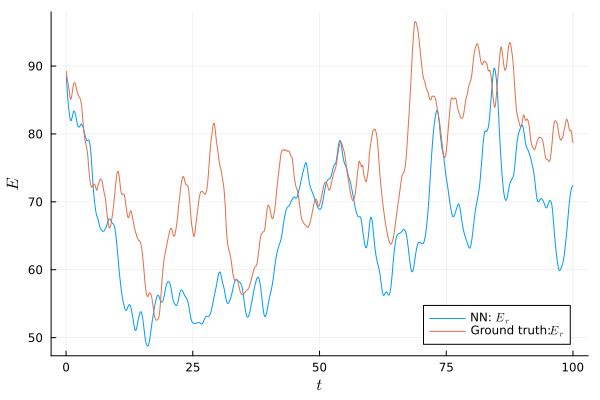

In [107]:
plot(t_pred,coarse_mesh.ip(pred_sim,pred_sim)[1:end],label = "NN: " * L"E_r")
plot!(t_data[1:end],coarse_mesh.ip(ref_data_trajectory[:,:,:,1,:],ref_data_trajectory[:,:,:,1,:])[1:end],label = "Ground truth:" * L"E_r")
#plot!(t_data[1:end],energies[:,:,:,1,:][1:end],label = L"E")
ylabel!(L"E")
xlabel!(L"t")